# Data analysis
We will briefly overview how to analyze data from exoplanet transit observations!!

### Import packages
The first thing we have to do is import the required packages. This is the same as gathering from our toolbox all the things we will need for a certain project...

Do not worry about all the weird text that will print out...

In [2]:
!pip -q install ipympl
!pip install -q lightkurve


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.0/519.0 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 79.8 MB/s eta 0:00:00


In [3]:

!pip install -q --upgrade "git+https://github.com/oscar-s-p/imageviewer.git"


  Cloning https://github.com/oscar-s-p/imageviewer.git to /tmp/pip-req-build-o7rvo66t
  Running command git clone --filter=blob:none --quiet https://github.com/oscar-s-p/imageviewer.git /tmp/pip-req-build-o7rvo66t
  Resolved https://github.com/oscar-s-p/imageviewer.git to commit b4813d5270c2135b7cac0f05242eeade481a8032
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 79.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 351.3/351.3 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 68.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 191.0/191.0 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━

In [1]:
import numpy as np
import pandas as pd
import os
import imageviewer as imgvw
from google.colab import output
output.enable_custom_widget_manager()
%matplotlib widget
import matplotlib.pyplot as plt

import lightkurve as lk

from astropy import units as u
from astropy.coordinates import SkyCoord

### Look at the data!
Now we are ready to explore the data that has been obtained.

But... where is it?

In [2]:
pwd

'/content'

In [3]:
os.chdir('/content/drive/MyDrive/Colab Notebooks/Exoplanets/Class 2')

In [4]:
pwd

'/content/drive/MyDrive/Colab Notebooks/Exoplanets/Class 2'

In [5]:
os.listdir()

['data_analysis.ipynb',
 'TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits',
 'TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5616-b_SDSSi.fits',
 'TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5616-b_SDSSr.fits']

In [6]:
files =  ['TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits',
          'TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5616-b_SDSSi.fits',
          'TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5616-b_SDSSr.fits']
files

['TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits',
 'TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5616-b_SDSSi.fits',
 'TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5616-b_SDSSr.fits']

In [7]:
iv = imgvw.image_viewer('')

Current working directory: /content/drive/MyDrive/Colab Notebooks/Exoplanets/Class 2
Image directory defined: /content/drive/MyDrive/Colab Notebooks/Exoplanets/Class 2
Total number of images found:  3


In [8]:
iv.df_files

,filename,path,telescope,camera,object,filter,size_MB,date_time,date,folder_found,im_type
0,TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5...,/content/drive/MyDrive/Colab Notebooks/Exoplan...,TTT2,QHY600-4,TOI-5616-b,SDSSg,61.16256,2026-02-17 00:35:18.684013,2026-02-16,,LB
1,TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5...,/content/drive/MyDrive/Colab Notebooks/Exoplan...,TTT2,QHY600-4,TOI-5616-b,SDSSr,61.16256,2026-02-17 00:36:42.995755,2026-02-16,,LB
2,TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5...,/content/drive/MyDrive/Colab Notebooks/Exoplan...,TTT2,QHY600-4,TOI-5616-b,SDSSi,61.16256,2026-02-17 00:38:17.329607,2026-02-16,,LB


------
Viewing image:
TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
    Object:  TOI-5616-b   -  Filter:  SDSSg


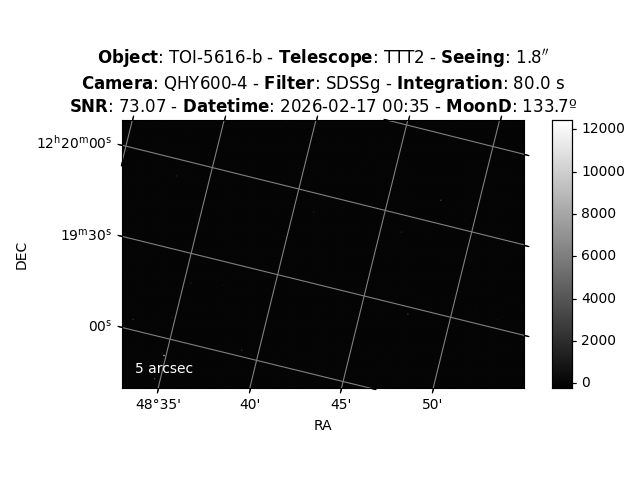

In [9]:
iv.view_image(0,
              manipulation_kw = {
                  'rotate' : False,
              })

------
Viewing image:
TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
    Object:  TOI-5616-b   -  Filter:  SDSSg


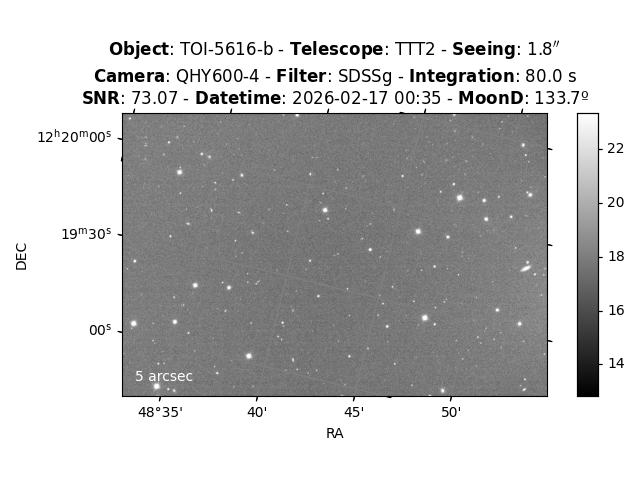

In [10]:
iv.view_image(0,
              manipulation_kw = {
                  'rotate' : False,
                  'stretch': 'linear',
                  'percentile': (5,95)
              })

In [11]:
iv.view_image([0,1,2],
              figsize = (12,20), nrows_ncols=(3,1),
              manipulation_kw = {
                  'rotate' : False,
                  'stretch': 'linear',
                  'percentile': (5,95)
              })

Output hidden; open in https://colab.research.google.com to view.

Try zooming into one of the stars above!
Do you see that the sky is really noisy?

Let's see what the data really looks like:

In [15]:
data = iv.read_data(0)
print(data.astype(np.int64))

Reading  TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
[[   0   15 4962 ...   21   17   12]
 [  10   12   11 ...   22   24   25]
 [   7   16   17 ...   11   13   24]
 ...
 [  11   13   25 ...   27   15   10]
 [   9    9    8 ...   11   13    7]
 [   5    6    8 ...    6    9    8]]


/tmp/ipython-input-1933685732.py:9: UserWarning: Attempt to set non-positive zlim on a log-scaled axis will be ignored.
  ax.set_zscale('log')


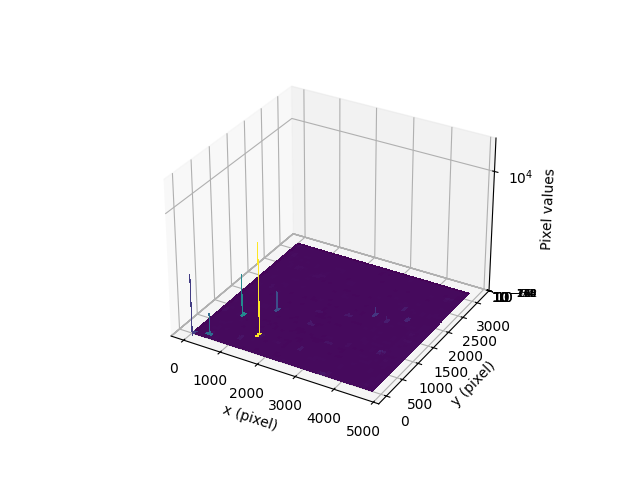

In [25]:

XX, YY = np.meshgrid(np.arange(data.shape[1]), np.arange(data.shape[0]))

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(XX, YY, data, cmap="viridis", linewidth=0, antialiased=False)
ax.set_xlabel("x (pixel)")
ax.set_ylabel("y (pixel)")
ax.set_zlabel("Pixel values")
ax.set_zscale('log')
plt.show()

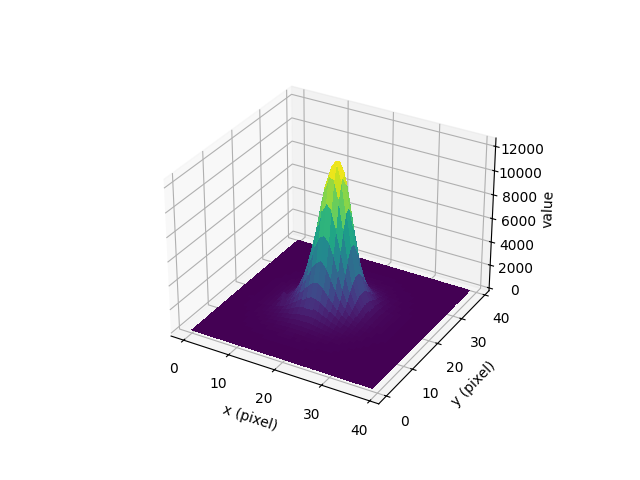

In [21]:

i, j = np.unravel_index(np.argmax(data), data.shape)
Z = data[i-20:i+20,j-20:j+20]

XX, YY = np.meshgrid(np.arange(Z.shape[0]), np.arange(Z.shape[1]))

fig = plt.figure()
ax = fig.add_subplot(111, projection="3d")
ax.plot_surface(XX, YY, Z, cmap="viridis", linewidth=0, antialiased=False)
ax.set_xlabel("x (pixel)")
ax.set_ylabel("y (pixel)")
ax.set_zlabel("Pixel values")
plt.show()

### Finding our target star

In [26]:
# We get the coordinates from the planning webpage
ra = '184.9016249900d'
dec = '48.6832888882d'

star_coordinates = SkyCoord(ra, dec, unit = (u.deg, u.deg))
print(star_coordinates)
print('RA: ', star_coordinates.ra)
print('DEC: ', star_coordinates.dec)

<SkyCoord (ICRS): (ra, dec) in deg
    (184.90162499, 48.68328889)>
RA:  184d54m05.849964s
DEC:  48d40m59.83999752s


------
Viewing image:
TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
    Object:  TOI-5616-b   -  Filter:  SDSSg


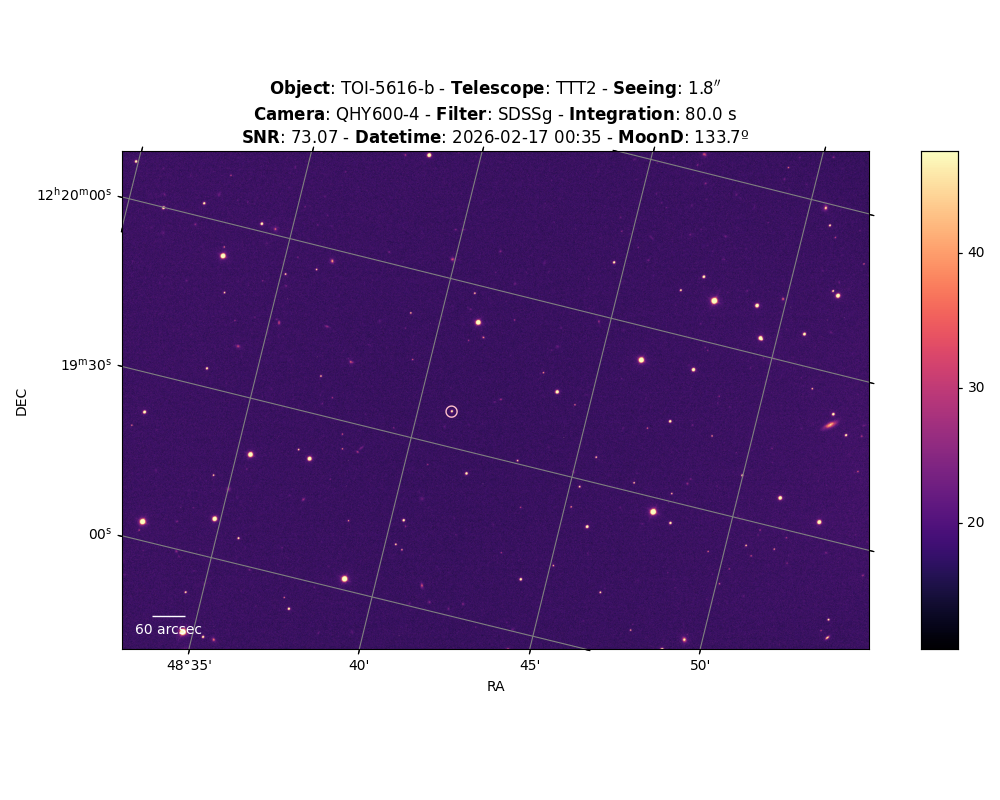

In [32]:
iv.view_image(0,
              figsize = (10,8),
              manipulation_kw = {
                  'rotate' : False,
                  'stretch': 'linear',
                  'percentile': (1,99.9),
                },
              plotting_kw= {
                  'cmap': 'magma', #viridis, plasma ...
                  'add_circle': {
                      'center': (ra, dec),
                      'size': '0 0 10d',
                      'color': 'pink',
                  },
                  'scalebar_arcsec': 60,
              }
              )

In [34]:
iv.view_image(0,
              figsize = (10,8),
              manipulation_kw = {
                  'rotate' : False,
                  'stretch': 'linear',
                  'percentile': (1,99.9),
                  'centered': (ra, dec),
                  'zoom': '0 5 0d',
                },
              plotting_kw= {
                  'cmap': 'magma',
                  'add_circle': {
                      'center': (ra, dec),
                      'size': '0 0 5d',
                      'color': 'pink',
                  },
                  'scalebar_arcsec': 60,
              }
              )

Output hidden; open in https://colab.research.google.com to view.

How does this star field compare with the reference one we had in the transit webpage? https://var.astro.cz/en/Exoplanets/2468
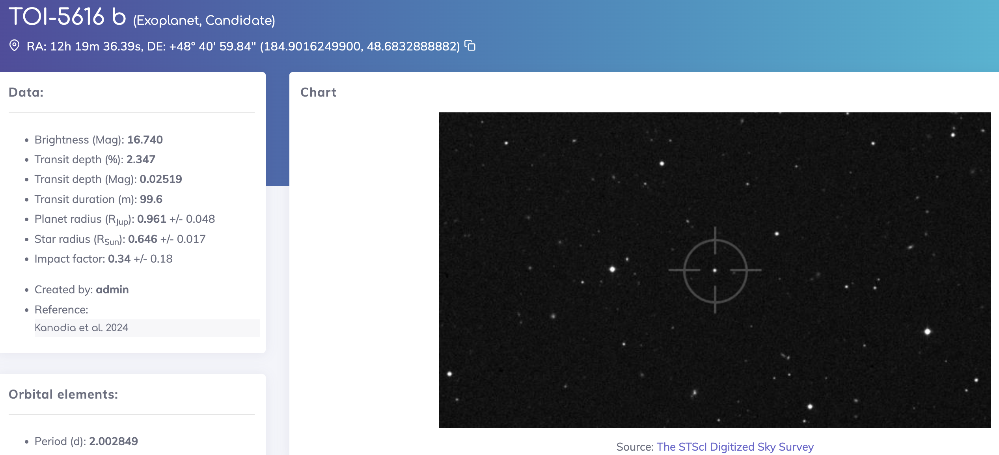

------
Viewing image:
TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
    Object:  TOI-5616-b   -  Filter:  SDSSg


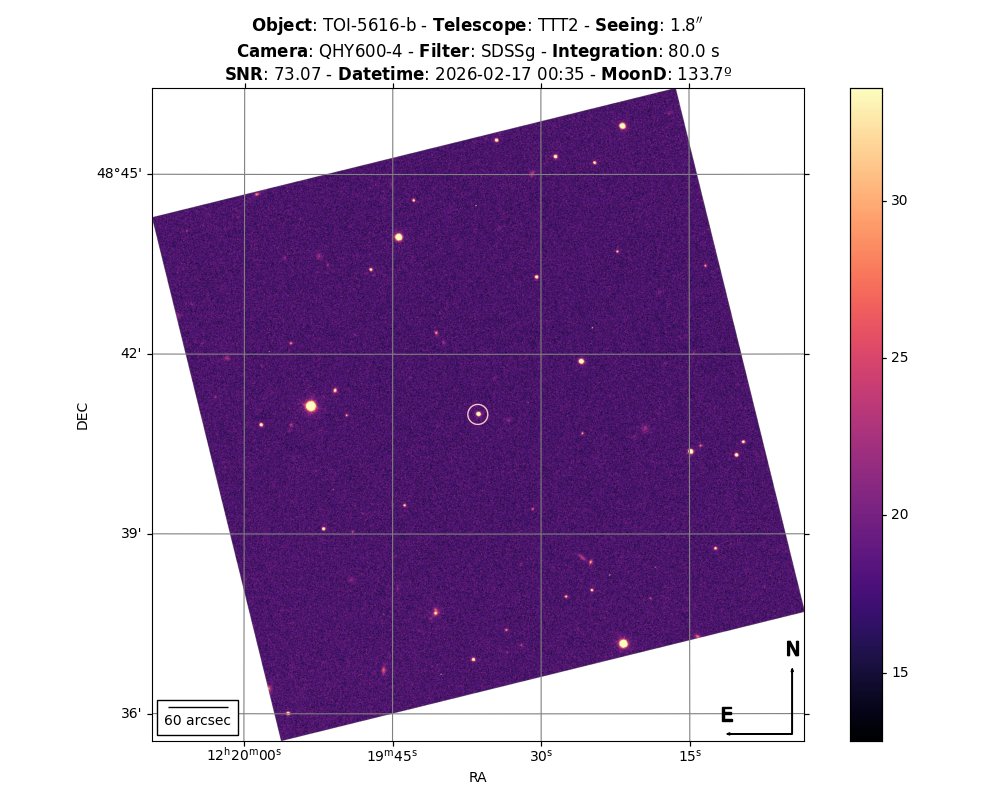

In [38]:
# we have to rotate the image and alignin it with the reference frame: North up and East left
iv.view_image(0,
              figsize = (10,8),
              manipulation_kw = {
                  'rotate' : True,
                  'stretch': 'linear',
                  'percentile': (1,99.9),
                  'centered': (ra, dec),
                  'zoom': '0 9 0d',
                },
              plotting_kw= {
                  'cmap': 'magma',
                  'add_circle': {
                      'center': (ra, dec),
                      'size': '0 0 10d',
                      'color': 'pink',
                  },
                  'scalebar_arcsec': 60,
                  'scalebar_frame': True,
              }
              )

### Looking at all the data
Alright, now we have looked at the data of one of the images. We really have ~150 images from that observation...

In [42]:
all_obs = pd.read_pickle('TOI-5616-b_df_files.pkl')
all_obs

,filename,path,telescope,camera,object,filter,size_MB,date_time,date,folder_found,im_type,seeing,moon,integration,EZP,ZP,SCALE,FWHM,TESS,DUSTPLA
0,TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSg,61.16256,2026-02-17 00:35:18.684013,2026-02-16,2026-02-16,LB,1.757604,133.683532,80.0,0.0037,23.0593,0.283,6.210615,NaN,0.001
1,TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSr,61.16256,2026-02-17 00:36:42.995755,2026-02-16,2026-02-16,LB,1.685914,133.689073,90.0,0.0032,22.3125,0.283,5.957292,NaN,0.001
2,TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSi,61.16256,2026-02-17 00:38:17.329607,2026-02-16,2026-02-16,LB,1.688831,133.695283,90.0,0.0047,21.3136,0.283,5.967600,NaN,0.001
3,TTT2_QHY600-4_2026-02-17-00-40-16-903629_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSg,61.16256,2026-02-17 00:40:16.903629,2026-02-16,2026-02-16,LB,1.794635,133.717422,80.0,0.0038,23.0708,0.283,6.341467,NaN,0.001
4,TTT2_QHY600-4_2026-02-17-00-41-41-206510_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSr,61.16256,2026-02-17 00:41:41.206510,2026-02-16,2026-02-16,LB,1.664303,133.722953,90.0,0.0026,22.3152,0.283,5.880929,NaN,0.001
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,TTT2_QHY600-4_2026-02-17-04-15-44-231643_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSr,61.16256,2026-02-17 04:15:44.231643,2026-02-16,2026-02-16,LB,1.932587,134.542053,90.0,0.0034,22.3337,0.283,6.828928,NaN,0.001
140,TTT2_QHY600-4_2026-02-17-04-17-18-581264_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSi,61.16256,2026-02-17 04:17:18.581264,2026-02-16,2026-02-16,LB,1.903386,134.547549,90.0,0.0049,21.3158,0.283,6.725745,NaN,0.001
141,TTT2_QHY600-4_2026-02-17-04-19-36-882364_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSg,61.16256,2026-02-17 04:19:36.882364,2026-02-16,2026-02-16,LB,1.629503,134.555605,80.0,0.0057,23.1054,0.283,5.757960,NaN,0.001
142,TTT2_QHY600-4_2026-02-17-04-21-01-196862_TOI-5...,/home/oscarsoler/work/red/2026-02-16/TTT2_QHY6...,TTT2,QHY600-4,TOI-5616-b,SDSSr,61.16256,2026-02-17 04:21:01.196862,2026-02-16,2026-02-16,LB,1.727132,134.560515,90.0,0.0025,22.3366,0.283,6.102939,NaN,0.001


In [44]:
all_obs.groupby('filter').size()

,0
filter,
SDSSg,48
SDSSi,48
SDSSr,48


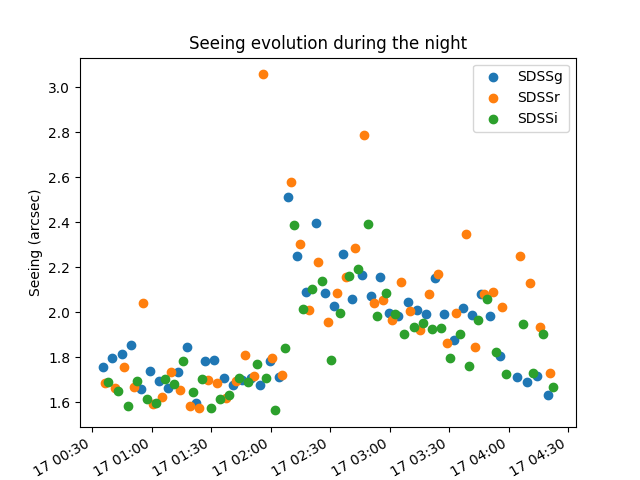

In [50]:
fig,ax = plt.subplots()
i=0
for filter in ['SDSSg', 'SDSSr', 'SDSSi']:
  ax.scatter(all_obs[all_obs['filter'] == filter]['date_time'],
             all_obs[all_obs['filter'] == filter]['seeing'],
             label = filter)
  i+=1
ax.set_xlabel('Time of observation')
ax.set_ylabel('Seeing (arcsec)')
ax.set_title('Seeing evolution during the night')
for label in ax.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')
ax.legend()

## Analyzing the data
Now we have to remember what do we want to extract from all of this data: the shape of the transit of an exoplanet. The light curve. This was the variation of the star brightness during the night.

To do so, we have to be able to calculate the star brightness on each image, and then compare it.

But the star brightness will change during the night by itself:
- Stars move along the sky. Their altitude changes, and the higher in the sky the brighter they appear

What we have to do is compare the brightness of our star with stars that are well catalogued and known as constant.

### Query a catalogue

Sky area observed in RA, DEC (deg): 
    [np.float64(184.66642035168232), np.float64(185.3095201666497)] [np.float64(48.46045334419402), np.float64(48.794192711650744)]
Querying SDSS
 - Found 11755 stars in the field
Filtered down to 1393 stars catalogued in SDSS with filter information in the magnitude range selected.


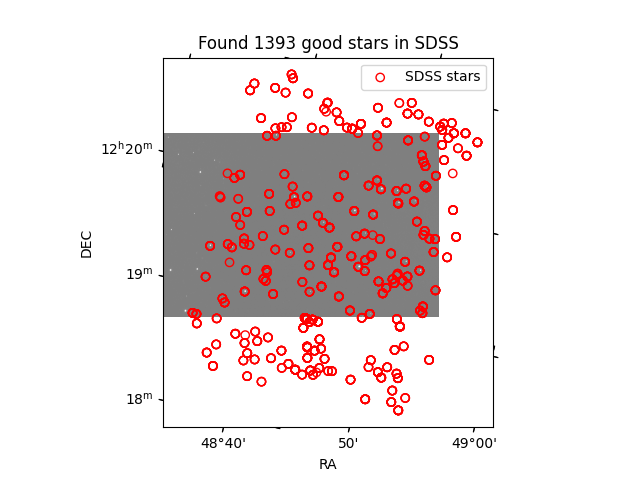

In [51]:
cat_table = imgvw.get_catalogue(iv.df_files['path'].iloc[0],
                                catalogue = 'SDSS',
                                filter = ['g', 'r', 'i'],
                                mag_range = (5,20),
                                plot = True,
                                rotate = False,
                               )

In [52]:
cat_table

ra,dec,g,r,i
float64,float64,float64,float64,float64
184.593132896439,48.6330095256365,16.22726,15.62772,15.4461
184.593142527819,48.6330095332421,16.2299,15.62918,15.44879
184.593142566759,48.6330095123151,16.22737,15.62767,15.4463
184.593147608689,48.633011752578,16.10826,15.61531,15.44332
184.593147608689,48.633011752578,16.10827,15.61531,15.44332
184.593148410624,48.6330008549813,16.1082,15.61519,15.44337
184.593148415945,48.633000888344,16.10842,15.61562,15.44356
184.594013149503,48.8934700778255,15.57971,15.12922,14.97584
184.594013149503,48.8934700778255,15.57971,15.12922,14.97584


We have obtained from the catalogue:
*   Star coordinates (ra, dec)
*   Magnitudes in each filter: g, r and i

The magnitude is a measurement of how bright a star seems from Earth. It depends on the stars true brightness and its distance from us.

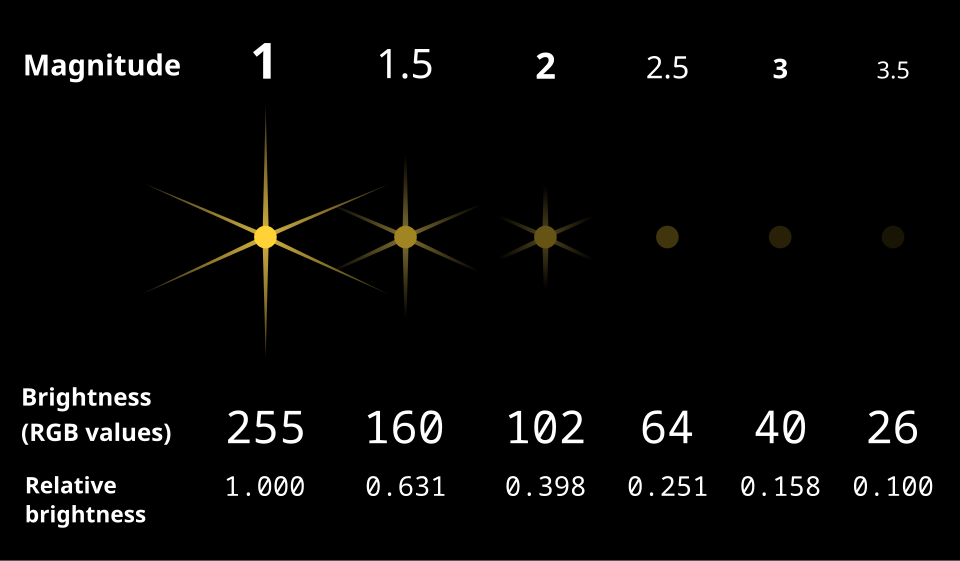


The limiting mangitude for the naked eye in a region with great sky is 7. Here we are looking at magnitudes down to almost 20!!

Some reference values:
*   Sun: -27
*   Full moon: -13
* Planets: -5 to 5
* Limit of naked eye: 7
* Limit with binoculars: 10
* Limit with 10" telescope: 16
* Limit with 20" telescope: 17.5
* Limit of our telescopes: 26
* Limit of 8m telescopes: 27
* Limit of spatial telescopes: 34



### Detect stars
To properly measure the magnitude we have to collect all of the light from the star, not just the maximum value of its central pixel, because the interaction with the atmosphere has made it look like a circle.

But first, let's collect the stars that we can detect in our image:

Removing sky background...
- Sky background mean: 17.91; Sky background std: 3.11
No initial table provided. Will perform source detection on the image.
If you want to save the output table: table.to_pandas().to_pickle("./table.pkl")
FWHM used for source detection: 6.21 pixels
No initial table provided. Using IRAFStarFinder for source detection.
- IRAFStarFinder threshold: 12.43
Detecting sources...
- Stars found by IRAFStarFinder: 148


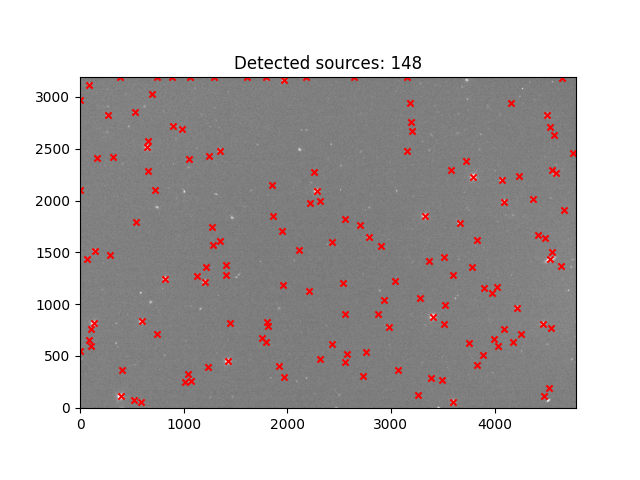

In [53]:
star_table = imgvw.detect_sources(iv.df_files['path'].iloc[0],
                                  method = 'IRAF',
                                  init_table = None,
                                  sky_threshold = 4,
                                  add_sources = False)

Removing sky background...
- Sky background mean: 17.91; Sky background std: 3.11
Initial table provided. Skipping source detection on the image.
Click on the image to add sources. Close the image when done.
  If you want to save the output table: table.to_pandas().to_pickle("./table.pkl")


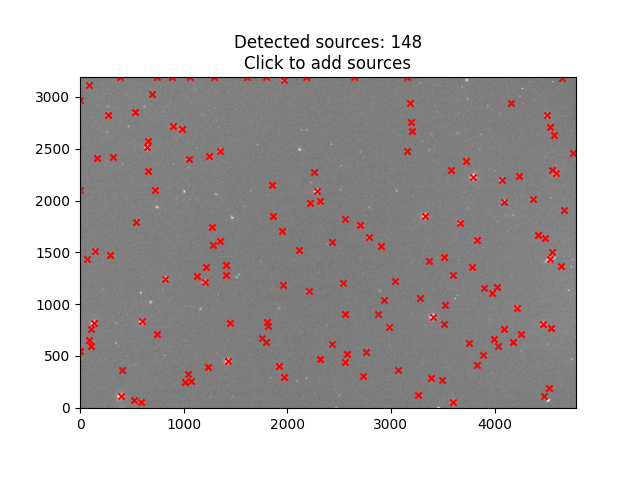

In [54]:
star_table_2 = imgvw.detect_sources(iv.df_files['path'].iloc[0],
                                    method = 'IRAF',
                                    init_table = star_table,
                                    sky_threshold = 4,
                                    add_sources = True)

In [55]:
star_table_2

ra,dec
float64,float64
184.6900126221402,48.57847124702315
185.0315904342382,48.798378043755854
184.86411821082496,48.79397444478497
184.76415609681365,48.54561031382274
184.75836471006556,48.65117010588321
184.974336220749,48.76986260591896
184.974608953119,48.552965799596805
184.83312685012515,48.59028843834265
184.9722730381104,48.68565897096803


### Perform photometry!!
This is the measurement of the brightness of the stars: we want to obtain their magnitude.


-----------------------------------------------------------
Photometric analysis of image /content/drive/MyDrive/Colab Notebooks/Exoplanets/Class 2/TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits
Removing sky background...
- Sky background mean: 17.905128; Sky background std: 3.107439
Initial number of star coordinates looked at: 151


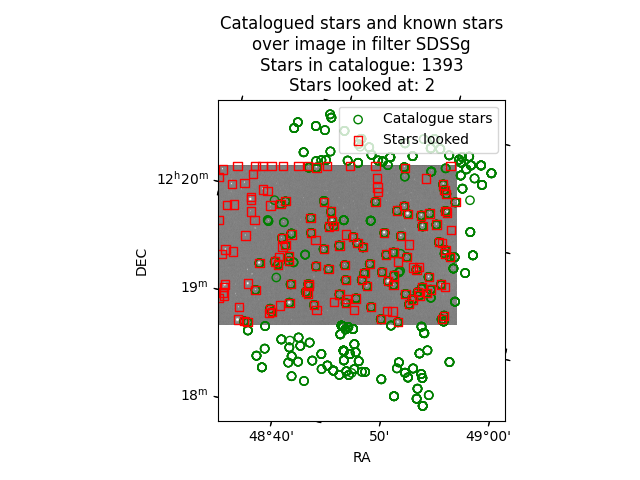

Performing aperture and PSF photometry on the image...
Error map average value: 3.9097376
FWHM: 6.21 px
PSF shape:  (19, 19)


/usr/local/lib/python3.12/dist-packages/imageviewer/photometry.py:211: RuntimeWarning: invalid value encountered in log10
  phot_g_all['mag_inst'] = -2.5 * np.log10(phot_g_all['flux_fit']) # type: ignore


Found stars by photometry:  151
Good photometry stars: 116


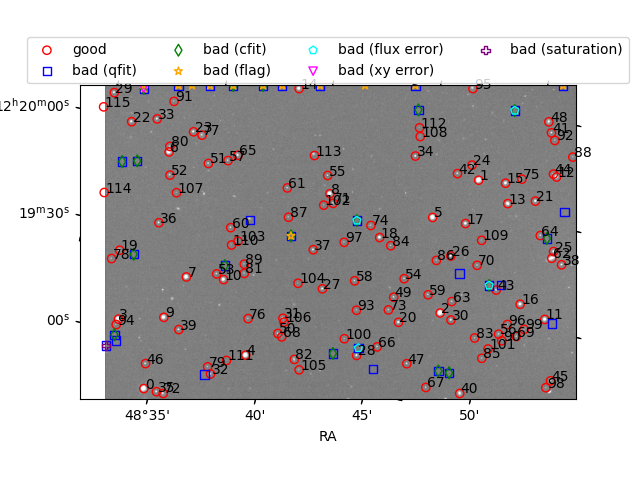

Stars matched with catalogue after filtering by magnitude and distance: 86
ZP = 26.855, rms = 1.78e-02
- ZP in header: 23.059, EZP: 3.70e-03
Number of stars used: 29


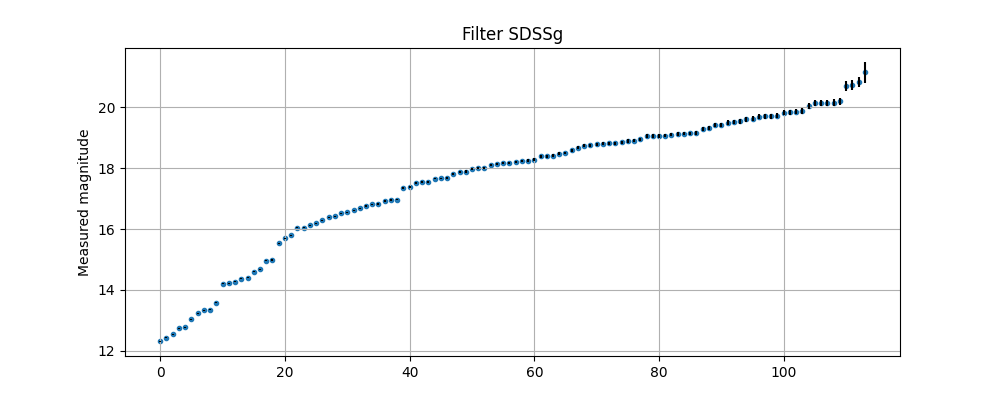

In [57]:
phot_table = imgvw.photo_analysis(iv.df_files['path'].iloc[0],
                                  cat_table = cat_table,
                                  plot=True,
                                  print_info=True,
                                  init_table = star_table_2,
                                  sky_background={'sigma': 3, 'maxiters': 5, 'sky_threshold': 4},
                                  photometry_params = {'psf_fwhm_shape': 3.0, 'aperture_fwhm': 3.0, 'fitter_maxiters': 200,
                                                        'qfit_filter': 8, 'cfit_filter': 0.05},
                                  matching_params={'mag_range': (10, 20), 'max_sep_pix': 5},
                                  )

----------- get_magnitude info -----------
Input star:   x y = 2111.578185 1521.529320  |  RA Dec = 184.901625 48.683289
Closest star: x y = 2113.903932 1521.331047  |  RA Dec = 184.901668 48.683468
Closest star magnitude: 16.955263 at distance 2.33 pixels
--------------------------------------------


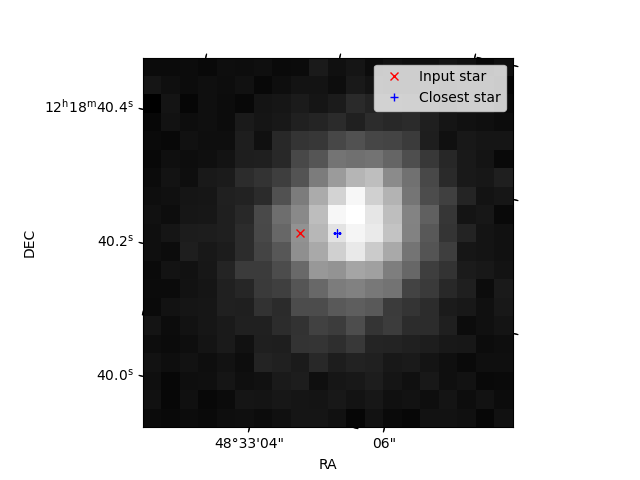

In [63]:
mag_star = imgvw.get_magnitude(iv.df_files['path'].iloc[0],
                              photometry_table = phot_table,
                              coords = star_coordinates,
                              pix_dist= 100, print_info=True,
                              show_plot=True)

In [66]:
print('Star magnitude: %.3f +- %.3f'%(mag_star[0], mag_star[1]))


Star magnitude: 16.955 +- 0.025


We have done it!! We have obtained the magnitude of our star for the first image of the night.

The next step would be to perform this calculations for all of the images that we have taken, and plot them to see the light curve.

This calculations take some time, so I have already done them...

In [69]:
filter_list = ['g', 'r', 'i']
object = 'TOI-5616-b'
phot_list = [pd.read_pickle('./%s_%s.pkl'%(object, fil)) for fil in filter_list]


In [70]:
phot_list[0]

,mag,err,time
0,16.955250,0.025118,2026-02-17 00:35:18.684013
1,16.953541,0.030390,2026-02-17 00:40:16.903629
2,16.947985,0.032582,2026-02-17 00:44:55.366493
3,16.963967,0.029197,2026-02-17 00:49:53.901667
4,16.942880,0.036579,2026-02-17 00:54:32.090512
5,16.948839,0.033799,2026-02-17 00:59:10.558425
6,NaN,NaN,2026-02-17 01:03:48.995888
7,16.946113,0.029893,2026-02-17 01:08:27.485901
8,16.960720,0.029591,2026-02-17 01:13:05.864848
9,16.961512,0.031189,2026-02-17 01:17:44.170726


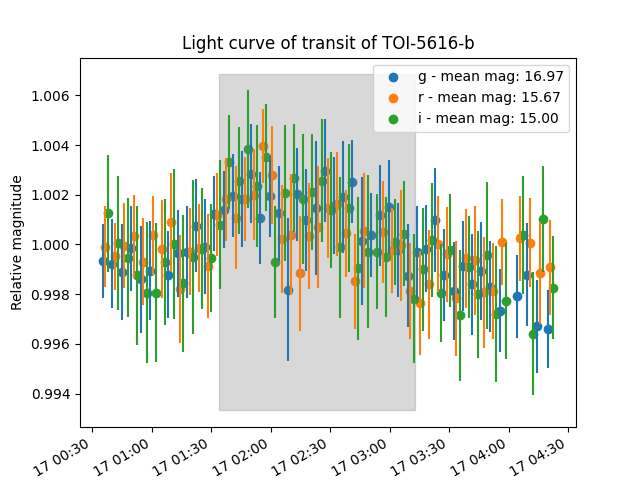

In [72]:
transit_init = pd.to_datetime('2026-02-17 01:34:00')
transit_end = pd.to_datetime('2026-02-17 03:13:00')

fig,ax = plt.subplots()

for i, fil in enumerate(filter_list):
    time = np.asarray(phot_list[i]['time'])
    m = np.asarray(phot_list[i]['mag'])
    err = np.asarray(phot_list[i]['err'])
    good = ~np.isnan(m.astype(float)) & ~np.isnan(m.astype(float))
    mean_mag = np.nanmean(m)
    m = m/mean_mag
    err = err/mean_mag
    ax.scatter(time[good], m[good],
               color = plt.get_cmap('tab10')(i),
               label = fil+ ' - mean mag: %.2f'%mean_mag)
    ax.errorbar(time[good], m[good], yerr = err[good],
                fmt="none", color = plt.get_cmap('tab10')(i))

ylims = ax.get_ylim()
ax.fill_between([transit_init, transit_end], ylims[1], ylims[0],
                color = 'gray', alpha = 0.3)

ax.set_xlabel('Time')
ax.set_ylabel('Relative magnitude')
ax.set_title('Light curve of transit of %s'%object)

for label in ax.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

ax.legend()

What!!! This does not look like a transit...

Well, there are many factors to take into account, like the weather variations during the night, but we have to remember: we were lookin at an exoplanet **candidate**!!

The transit may not have happened, or may have happened at a different time than the predicted one. No results is also a good result!!

# Another observation

Let's look at another of the observations we performed with the telescopes: another exoplanet candidate.
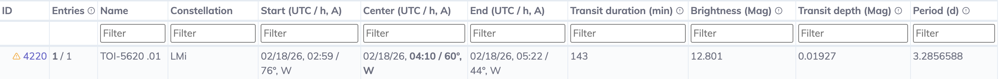

In [93]:
os.listdir()

['data_analysis.ipynb',
 'TTT2_QHY600-4_2026-02-17-00-35-18-684013_TOI-5616-b_SDSSg.fits',
 'TTT2_QHY600-4_2026-02-17-00-38-17-329607_TOI-5616-b_SDSSi.fits',
 'TTT2_QHY600-4_2026-02-17-00-36-42-995755_TOI-5616-b_SDSSr.fits',
 'TOI-5616-b_df_files.pkl',
 'TOI-5616-b_i.pkl',
 'TOI-5616-b_r.pkl',
 'TOI-5616-b_g.pkl',
 'TOI-5620-01_i.pkl',
 'TOI-5620-01_g.pkl',
 'TOI-5620-01_r.pkl']

In [94]:
object = 'TOI-5620-01'
phot_list = [pd.read_pickle('./%s_%s.pkl'%(object, fil)) for fil in filter_list]
phot_list[0]

,mag,err,time
0,13.291957,0.035436,2026-02-18 02:59:53.708985
1,13.252267,0.025340,2026-02-18 03:03:11.802653
2,13.245097,0.028417,2026-02-18 03:06:29.893217
3,13.214680,0.030469,2026-02-18 03:09:48.023003
4,13.259193,0.024750,2026-02-18 03:13:06.142039
5,13.275458,0.025003,2026-02-18 03:16:24.291011
6,13.294996,0.021888,2026-02-18 03:19:42.473097
7,NaN,NaN,2026-02-18 03:23:00.569719
8,13.235651,0.021392,2026-02-18 03:26:18.751887
9,13.285922,0.030261,2026-02-18 03:29:36.906586


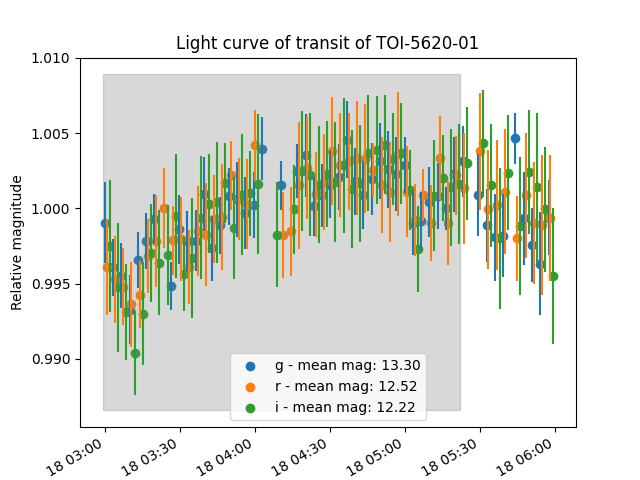

In [95]:
transit_init = pd.to_datetime('2026-02-18 02:59:00')
transit_end = pd.to_datetime('2026-02-18 05:22:00')

fig,ax = plt.subplots()

for i, fil in enumerate(filter_list):
    time = np.asarray(phot_list[i]['time'])
    m = np.asarray(phot_list[i]['mag'])
    err = np.asarray(phot_list[i]['err'])
    good = ~np.isnan(m.astype(float)) & ~np.isnan(m.astype(float))
    mean_mag = np.nanmean(m)
    m = m/mean_mag
    err = err/mean_mag
    ax.scatter(time[good], m[good],
               color = plt.get_cmap('tab10')(i),
               label = fil+ ' - mean mag: %.2f'%mean_mag)
    ax.errorbar(time[good], m[good], yerr = err[good],
                fmt="none", color = plt.get_cmap('tab10')(i))

ylims = ax.get_ylim()
ax.fill_between([transit_init, transit_end], ylims[1], ylims[0],
                color = 'gray', alpha = 0.3)

ax.set_xlabel('Time')
ax.set_ylabel('Relative magnitude')
ax.set_title('Light curve of transit of %s'%object)

for label in ax.get_xticklabels(which='major'):
    label.set(rotation=30, horizontalalignment='right')

ax.legend()

Here we detected a transit!! But I got confused when planning the observation, and set the wrong initial time 😞... I should have began observing one hour before to get a good baseline before the transit happened.

Some times you can blame external factors, but some times it is human error!!

## Let's look at some other data

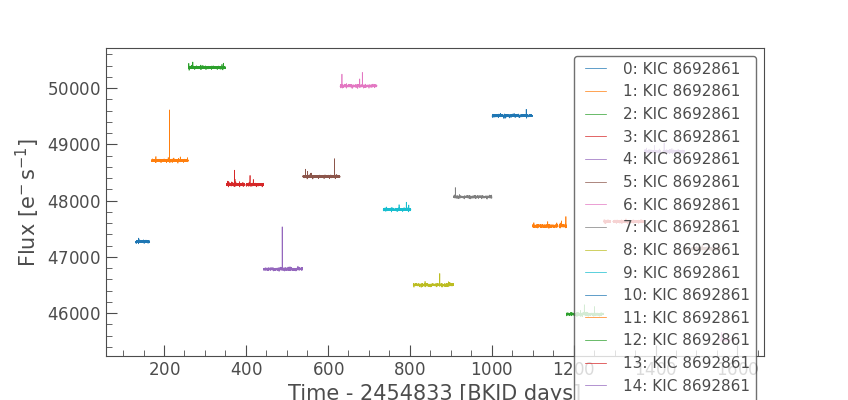

In [100]:
# Search for Kepler observations of Kepler-69
search_result = lk.search_lightcurve('Kepler-69', author='Kepler', cadence='long')
# Download all available Kepler light curves
lc_collection = search_result.download_all()
lc_collection.plot();

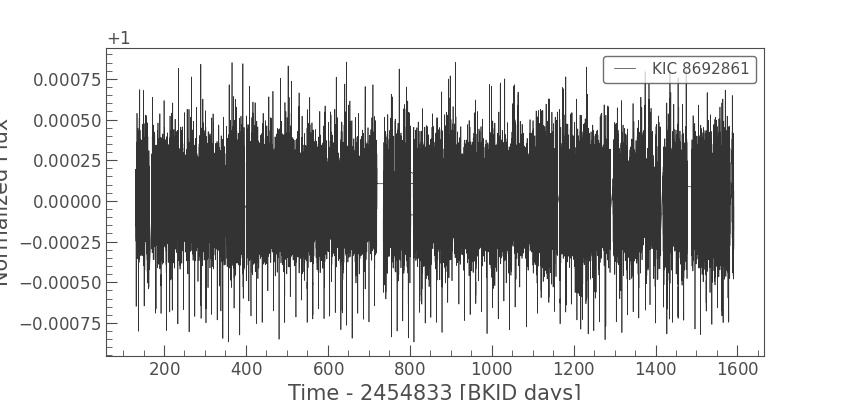

In [101]:
# Flatten the light curve
lc = lc_collection.stitch().flatten(window_length=901).remove_outliers()
lc.plot();

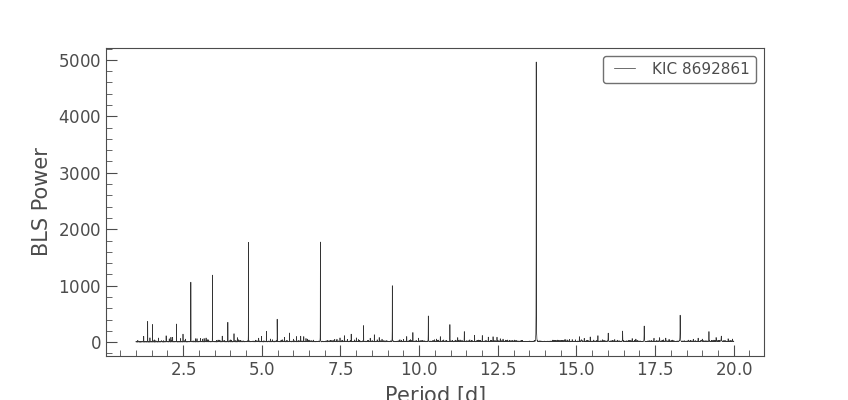

In [102]:
# Create array of periods to search
period = np.linspace(1, 20, 10000)
# Create a BLSPeriodogram
bls = lc.to_periodogram(method='bls', period=period, frequency_factor=500);
bls.plot();

In [103]:
planet_b_period = bls.period_at_max_power
planet_b_t0 = bls.transit_time_at_max_power
planet_b_dur = bls.duration_at_max_power

# Check the value for period
planet_b_period

<Quantity 13.72177218 d>

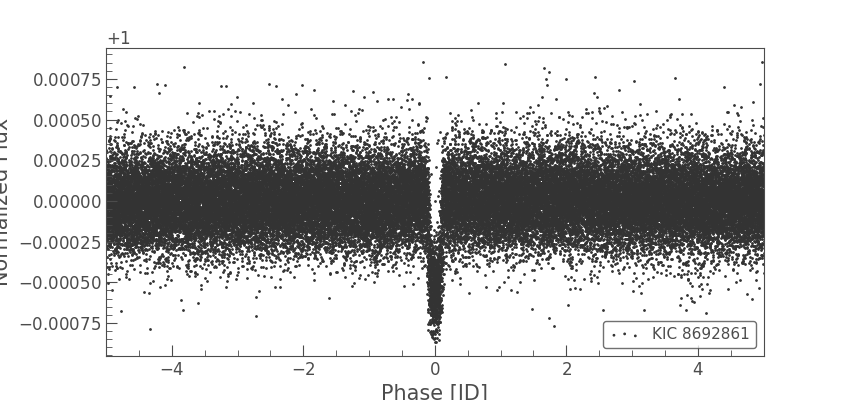

In [104]:
ax = lc.fold(period=planet_b_period, epoch_time=planet_b_t0).scatter()
ax.set_xlim(-5, 5);

In [106]:
# Create a BLS model using the BLS parameters
planet_b_model = bls.get_transit_model(period=planet_b_period,
                                       transit_time=planet_b_t0,
                                       duration=planet_b_dur)

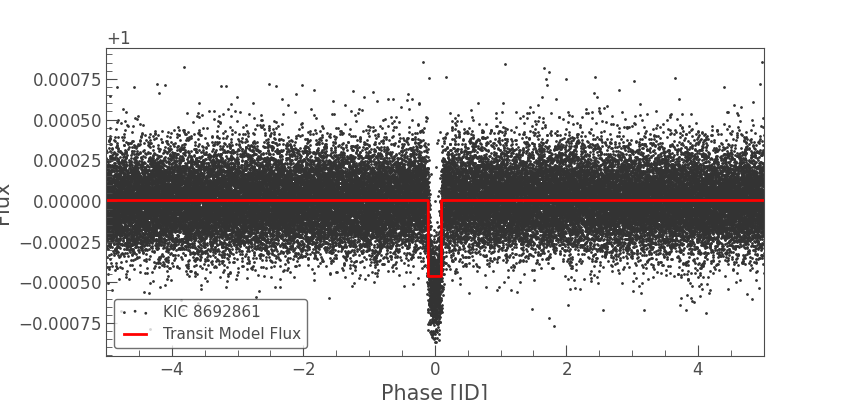

In [107]:
ax = lc.fold(planet_b_period, planet_b_t0).scatter()
planet_b_model.fold(planet_b_period, planet_b_t0).plot(ax=ax, c='r', lw=2)
ax.set_xlim(-5, 5);